In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.random_projection import GaussianRandomProjection
from scipy.stats import gaussian_kde
from matplotlib.colors import Normalize
import matplotlib.cm as cm
import seaborn as sns
from pathlib import Path

sns.set_theme(context="notebook", style="ticks")

def plot_ring_density(
    embeddings: np.ndarray,
    title: str = None,
    random_state: int = 42,
    n_theta: int = 360,
    ring_mode: str = "angle",     # "angle"(推荐更稳更快) or "kde2d"(复刻你示例)
    bw_angle: float = 0.25,
    bw_2d: float = 0.10,
    sample: int | None = 20000,   # N 很大建议抽样；None=不抽
    line_width: int = 20,
    cmap_name: str = "RdPu",
    dpi: int = 500,
    figsize=(6, 10),
    save_path: str | None = None,
):
    X = np.asarray(embeddings, dtype=np.float64)
    X = X[~np.isnan(X).any(axis=1)]
    if sample is not None and len(X) > sample:
        rng = np.random.default_rng(random_state)
        X = X[rng.choice(len(X), size=sample, replace=False)]

    # 1) L2 归一化
    X = X / (np.linalg.norm(X, axis=1, keepdims=True) + 1e-12)

    # 2) 到 2D：d>2 用随机投影；d==2 直接用
    if X.shape[1] > 2:
        projector = GaussianRandomProjection(n_components=2, random_state=random_state)
        proj_2d = projector.fit_transform(X)
    else:
        proj_2d = X[:, :2].copy()

    # 3) 投影后归一化到单位圆
    proj_2d = proj_2d / (np.linalg.norm(proj_2d, axis=1, keepdims=True) + 1e-12)

    angles = np.arctan2(proj_2d[:, 1], proj_2d[:, 0])

    theta_vals = np.linspace(-np.pi, np.pi, n_theta, endpoint=False)
    ring_x = np.cos(theta_vals)
    ring_y = np.sin(theta_vals)

    cmap = cm.get_cmap(cmap_name)

    # 圆环着色密度
    if ring_mode == "kde2d":
        kde_2d = gaussian_kde(proj_2d.T, bw_method=bw_2d)
        densities = kde_2d(np.vstack([ring_x, ring_y]))
    elif ring_mode == "angle":
        kde_1d_for_ring = gaussian_kde(angles, bw_method=bw_angle)
        densities = kde_1d_for_ring(theta_vals)
    else:
        raise ValueError("ring_mode must be 'angle' or 'kde2d'")

    norm = Normalize(vmin=float(densities.min()), vmax=float(densities.max()))

    # 角度 KDE
    kde_1d = gaussian_kde(angles, bw_method=bw_angle)
    x_angle = np.linspace(-np.pi, np.pi, 400)
    y_angle = kde_1d(x_angle)

    fig, (ax_top, ax_bottom) = plt.subplots(
        2, 1, figsize=figsize,
        gridspec_kw={"height_ratios": [3, 1], "hspace": 0.25},
        dpi=dpi
    )

    # 上：圆环
    for i in range(len(theta_vals) - 1):
        color = cmap(norm(densities[i]))
        ax_top.plot([ring_x[i], ring_x[i+1]], [ring_y[i], ring_y[i+1]],
                    color=color, linewidth=line_width, solid_capstyle='round')

    circle_outline = plt.Circle((0, 0), 1.0, color='black', fill=False, lw=1.5, linestyle='--')
    ax_top.add_patch(circle_outline)

    ax_top.set_aspect("equal", "box")
    ax_top.set_xlim(-1.1, 1.1)
    ax_top.set_ylim(-1.1, 1.1)
    ax_top.set_xticks([-1, -0.5, 0, 0.5, 1])
    ax_top.set_yticks([-1, -0.5, 0, 0.5, 1])
    for sp in ax_top.spines.values():
        sp.set_linewidth(1.5)

    ax_top.tick_params(which='both', direction='out', length=5, width=1.5, labelsize=25)
    for lab in ax_top.get_xticklabels() + ax_top.get_yticklabels():
        lab.set_fontweight('bold')

    ax_top.set_xlabel("Features", fontsize=30, fontweight='bold')
    ax_top.set_ylabel("Features", fontsize=30, fontweight='bold')
    if title:
        ax_top.set_title(title, fontsize=20, fontweight="bold", pad=10)

    # 下：角度分布
    ax_bottom.plot(x_angle, y_angle, lw=2)
    ax_bottom.fill_between(x_angle, y_angle, alpha=0.3)
    ax_bottom.set_xlim(-np.pi, np.pi)
    ax_bottom.tick_params(which='both', direction='out', length=5, width=1.5, labelsize=25)
    for lab in ax_bottom.get_xticklabels() + ax_bottom.get_yticklabels():
        lab.set_fontweight('bold')
    ax_bottom.set_xlabel("Angles", fontsize=30, fontweight='bold')
    ax_bottom.set_ylabel("Density", fontsize=30, fontweight='bold')

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches="tight")
    plt.show()


In [2]:
ROOT_MULTI = "/root/Invertebrates_EC50_multi_fusion"
OUT_DIR = Path(f"{ROOT_MULTI}/ring_density_plots")
OUT_DIR.mkdir(parents=True, exist_ok=True)
print("OUT_DIR =", OUT_DIR)


OUT_DIR = /root/Invertebrates_EC50_multi_fusion/ring_density_plots


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


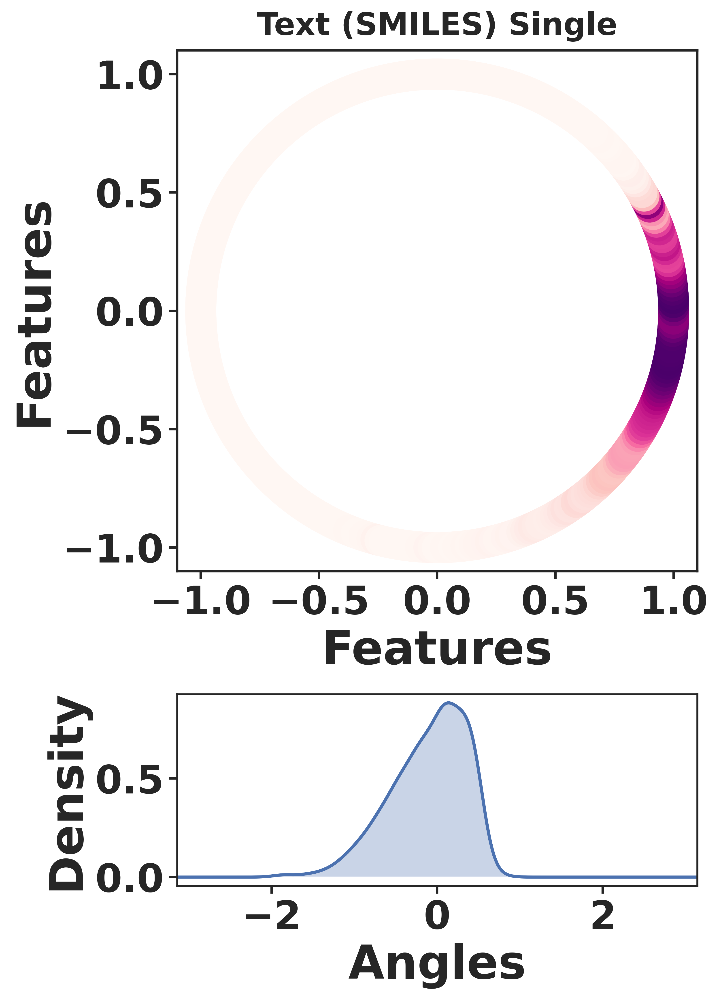

In [3]:
X = np.load("/root/Invertebrates_EC50_multi_fusion/SMILES/smiles_outputs/reg_smiles_cls_embeddings_all.npy")
plot_ring_density(
    X, title="Text (SMILES) Single",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_text_single.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


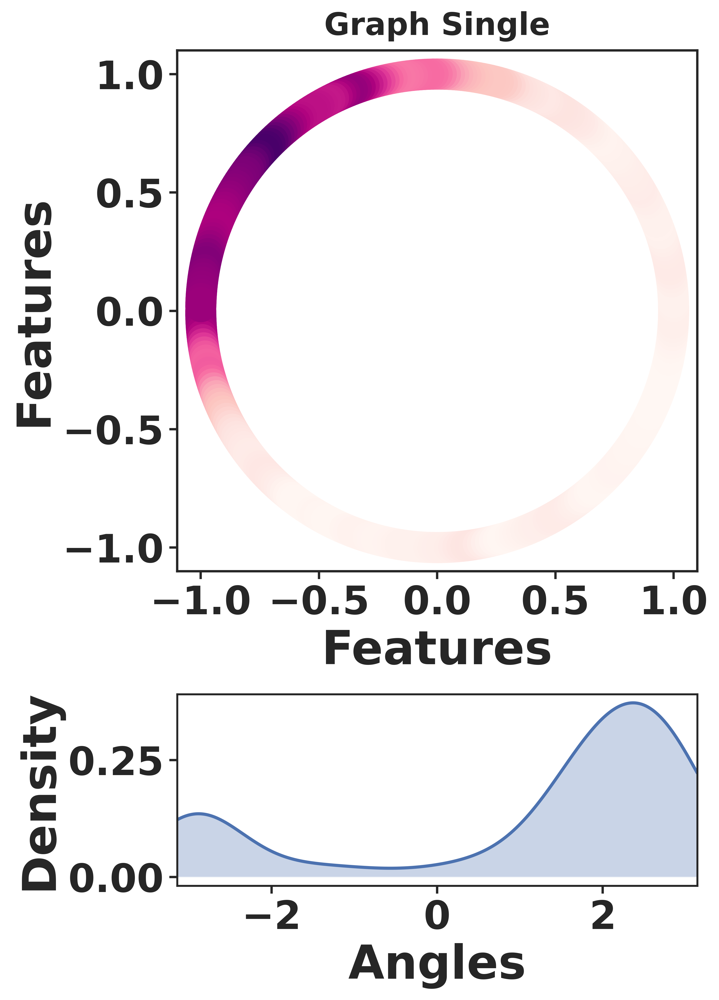

In [4]:
X = np.load("/root/Invertebrates_EC50_multi_fusion/graph/graph_outputs/reg_graph_embeddings.npy")
plot_ring_density(
    X, title="Graph Single",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_graph_single.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


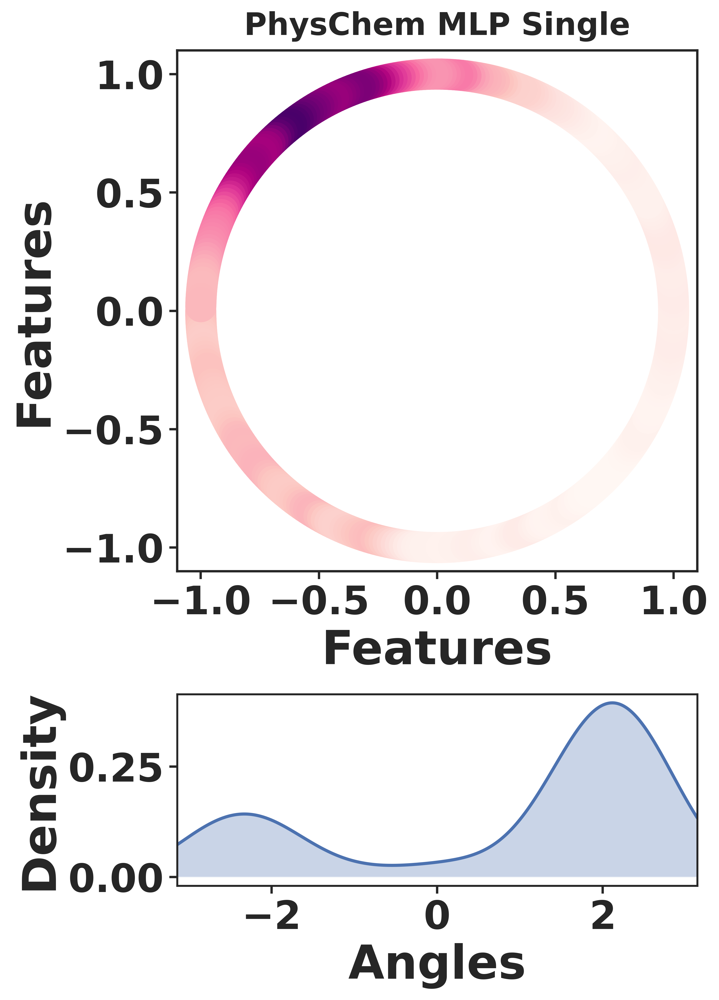

In [5]:
PHY_OUT_DIR = "/root/Invertebrates_EC50_multi_fusion/phychem/physchem_mlp_rf_v2"
X = np.load(f"{PHY_OUT_DIR}/emb_physchem_mlp_all.npy")
plot_ring_density(
    X, title="PhysChem MLP Single",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_physchem_single.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


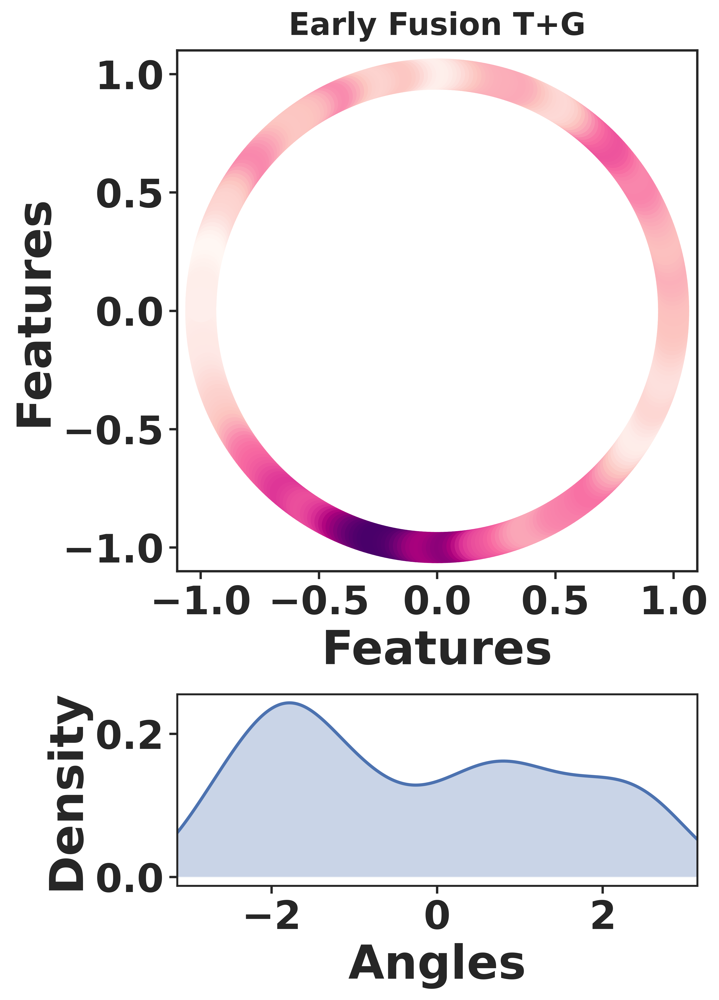

In [6]:
FUSION_DIR = f"{ROOT_MULTI}/early(T+G)/text_plus_graph_simple"
X = np.load(f"{FUSION_DIR}/X_all_tg_fused.npy")
plot_ring_density(
    X, title="Early Fusion T+G",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_early_TG.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


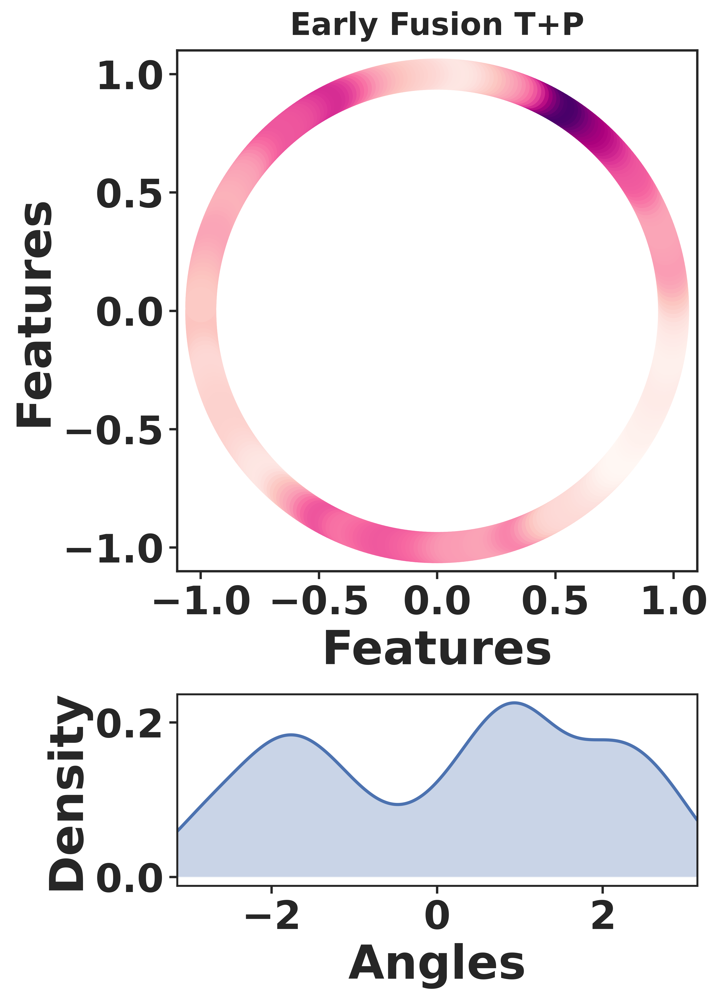

In [7]:
FUSION_DIR = f"{ROOT_MULTI}/early(T+P)/text_plus_physchem_simple"
X = np.load(f"{FUSION_DIR}/X_all_tp_fused.npy")
plot_ring_density(
    X, title="Early Fusion T+P",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_early_TP.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


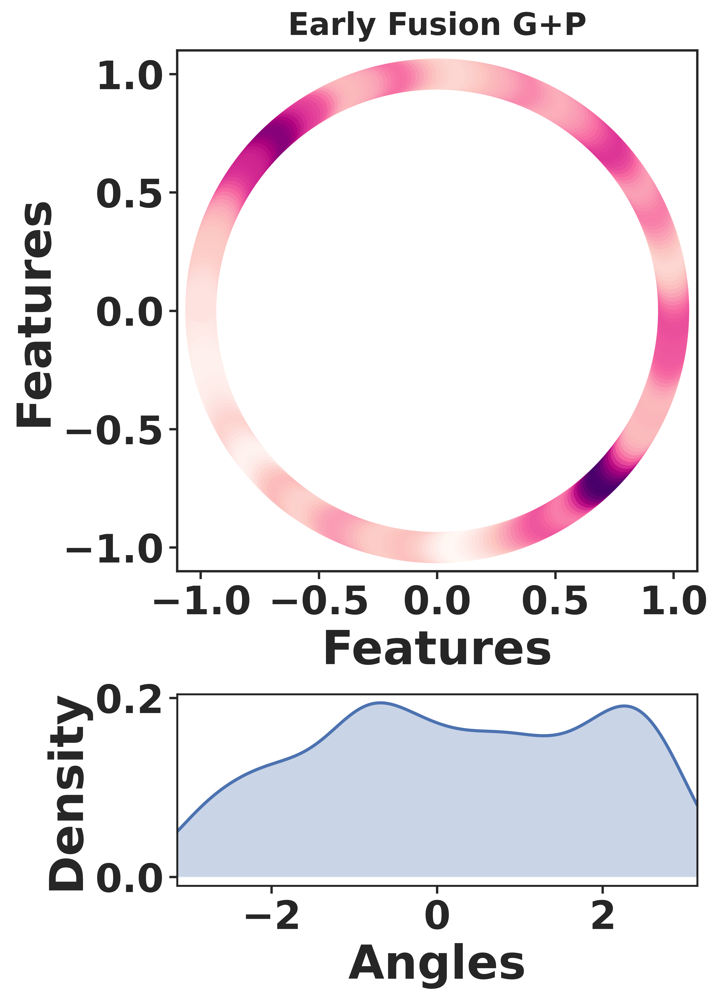

In [8]:
FUSION_DIR = f"{ROOT_MULTI}/early(G+P)/graph_plus_physchem_simple"
X = np.load(f"{FUSION_DIR}/X_all_gp_fused.npy")
plot_ring_density(
    X, title="Early Fusion G+P",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_early_GP.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


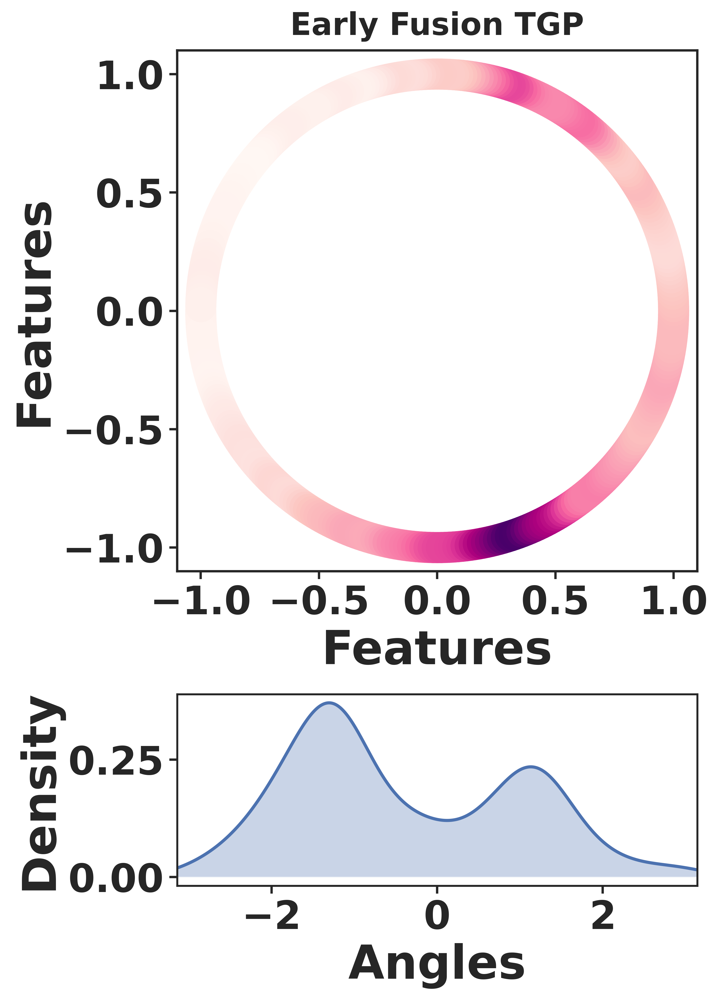

In [9]:
FUSION_DIR = f"{ROOT_MULTI}/early_fusion_TGP"
X_train = np.load(f"{FUSION_DIR}/X_train_TGP_early.npy")
X_test  = np.load(f"{FUSION_DIR}/X_test_TGP_early.npy")
X = np.vstack([X_train, X_test])
plot_ring_density(
    X, title="Early Fusion TGP",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_early_TGP.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


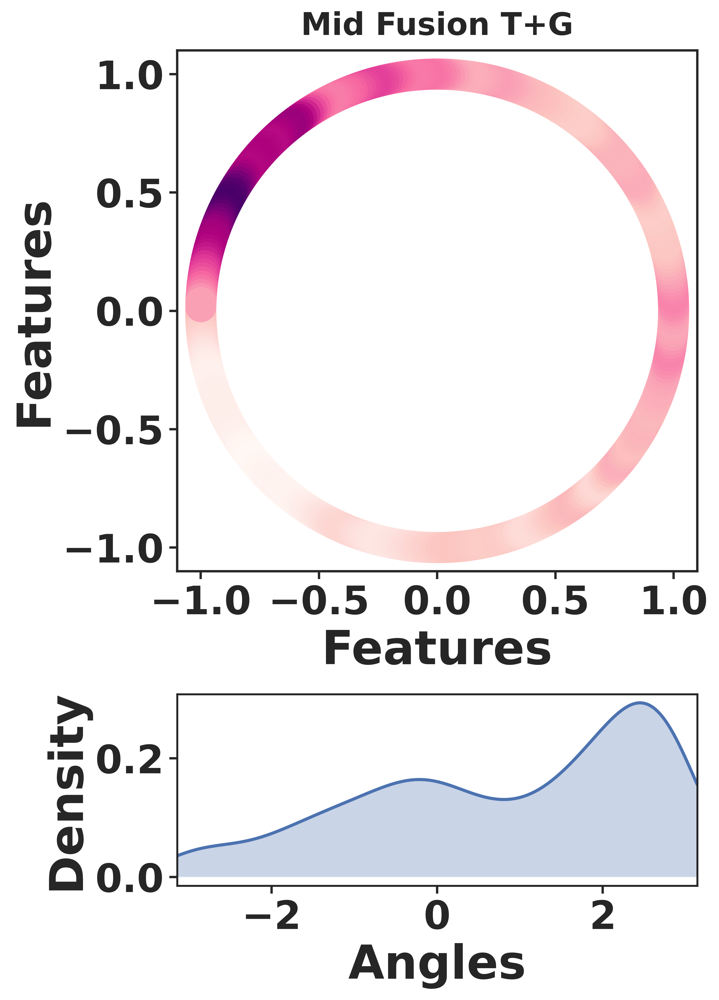

In [10]:
MID_DIR = f"{ROOT_MULTI}/mid(T+G)/text_graph_meta"
X = np.load(f"{MID_DIR}/fused_all_T_G.npy")
plot_ring_density(
    X, title="Mid Fusion T+G",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_mid_TG.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


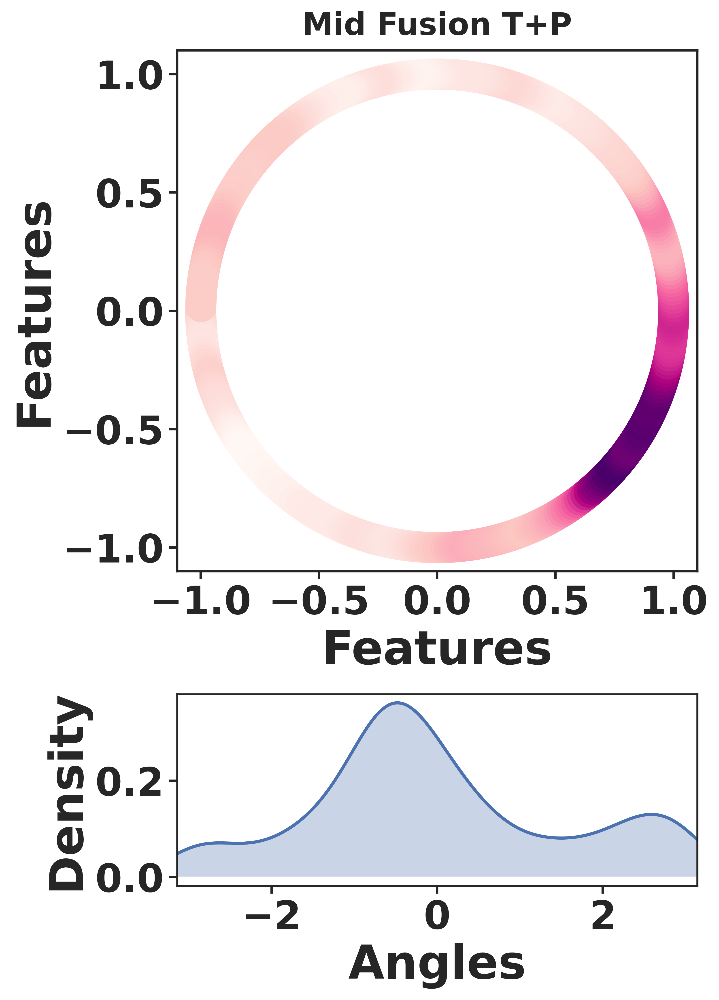

In [11]:
MID_DIR = f"{ROOT_MULTI}/mid(T+P)/text_physchem_meta"
X = np.load(f"{MID_DIR}/fused_all_T_P.npy")
plot_ring_density(
    X, title="Mid Fusion T+P",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_mid_TP.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


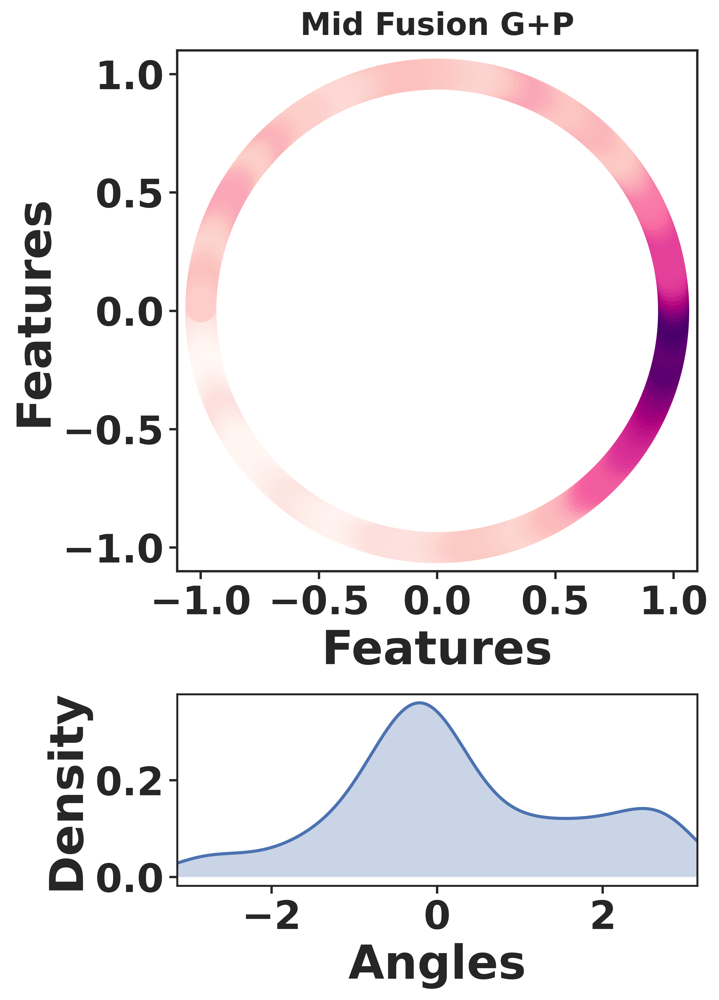

In [12]:
MID_DIR = f"{ROOT_MULTI}/mid(G+P)/graph_physchem_meta"
X = np.load(f"{MID_DIR}/fused_all_G_P.npy")
plot_ring_density(
    X, title="Mid Fusion G+P",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_mid_GP.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


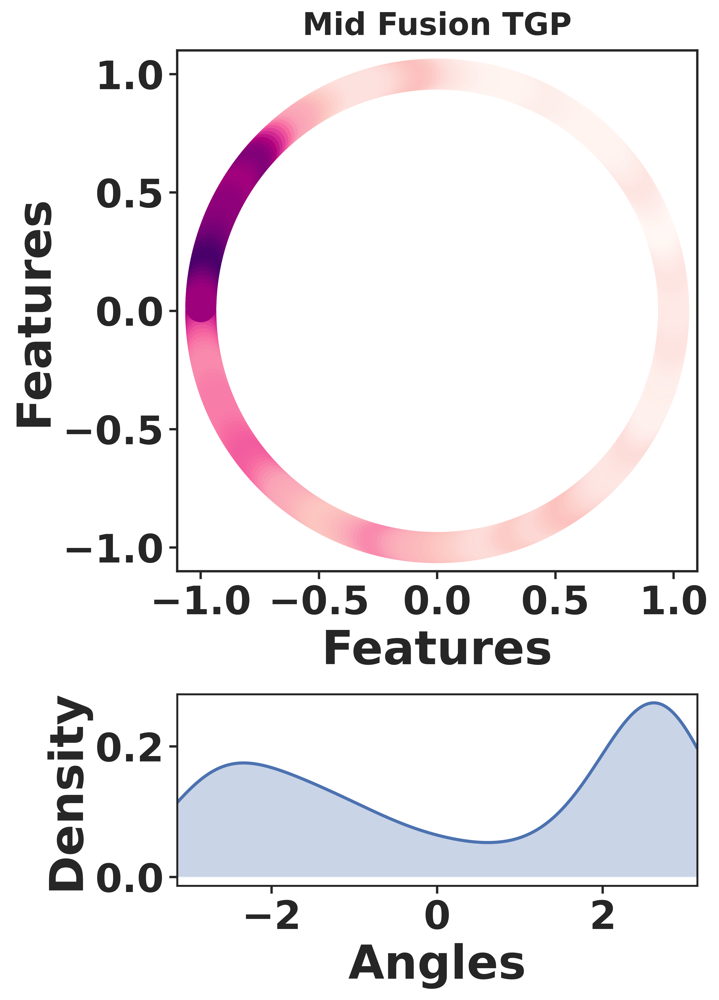

In [13]:
MID_DIR = f"{ROOT_MULTI}/mid_fusion_TGP"
X = np.load(f"{MID_DIR}/fused_emb_TGP_all.npy")
plot_ring_density(
    X, title="Mid Fusion TGP",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_mid_TGP.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


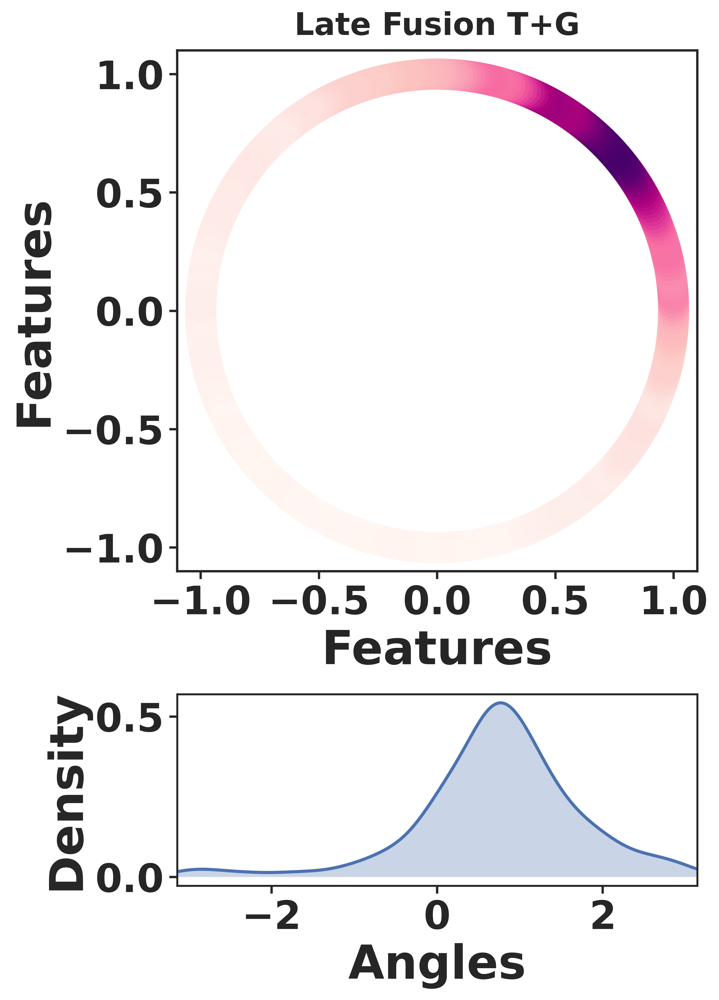

In [14]:
LATE_DIR = f"{ROOT_MULTI}/late_fusion_pairs/T_G"
X_train = np.load(f"{LATE_DIR}/late_T_G_emb_train.npy")
X_test  = np.load(f"{LATE_DIR}/late_T_G_emb_test.npy")
X = np.vstack([X_train, X_test])
plot_ring_density(
    X, title="Late Fusion T+G",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_late_TG.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


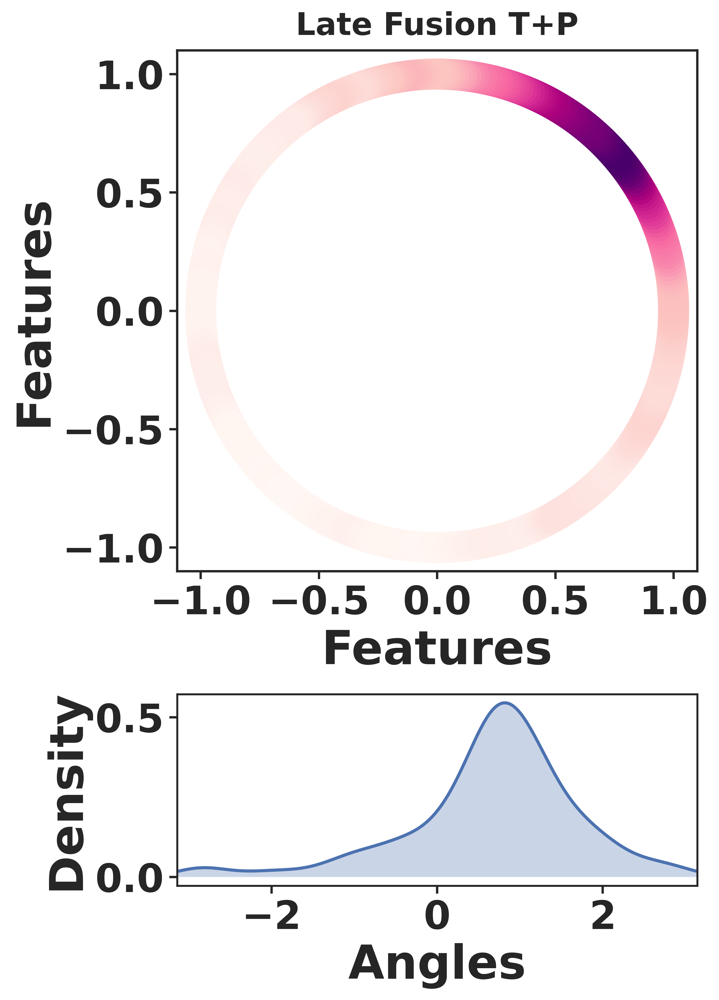

In [15]:
LATE_DIR = f"{ROOT_MULTI}/late_fusion_pairs/T_P"
X_train = np.load(f"{LATE_DIR}/late_T_P_emb_train.npy")
X_test  = np.load(f"{LATE_DIR}/late_T_P_emb_test.npy")
X = np.vstack([X_train, X_test])
plot_ring_density(
    X, title="Late Fusion T+P",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_late_TP.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


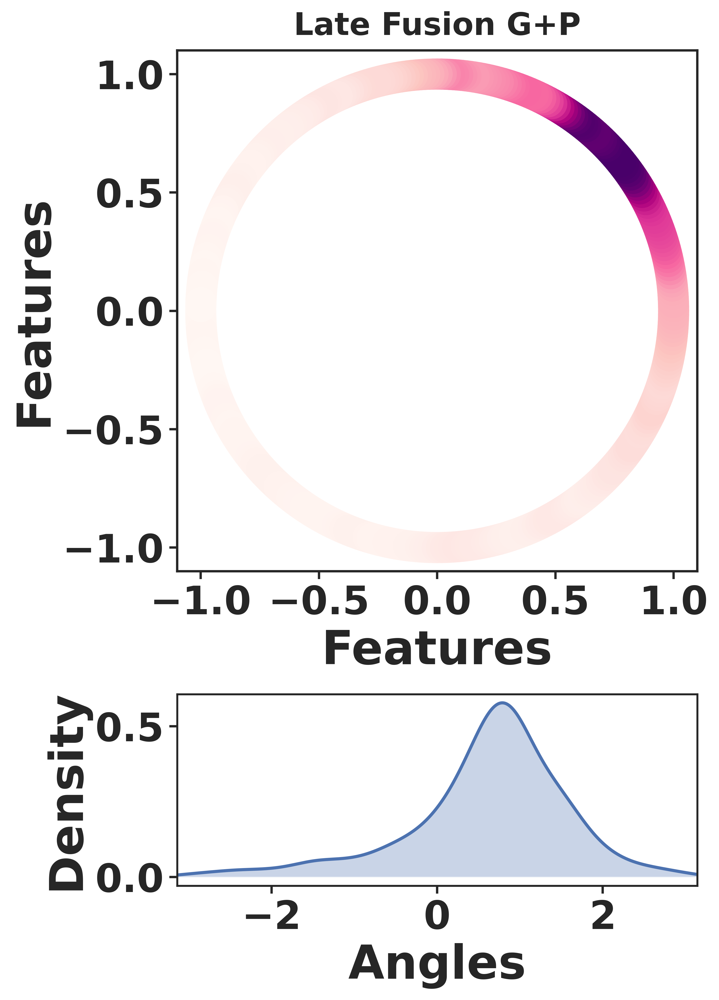

In [16]:
LATE_DIR = f"{ROOT_MULTI}/late_fusion_pairs/G_P"
X_train = np.load(f"{LATE_DIR}/late_G_P_emb_train.npy")
X_test  = np.load(f"{LATE_DIR}/late_G_P_emb_test.npy")
X = np.vstack([X_train, X_test])
plot_ring_density(
    X, title="Late Fusion G+P",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_late_GP.png")
)


/tmp/ipykernel_1594/3409487074.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(cmap_name)
/tmp/ipykernel_1594/3409487074.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


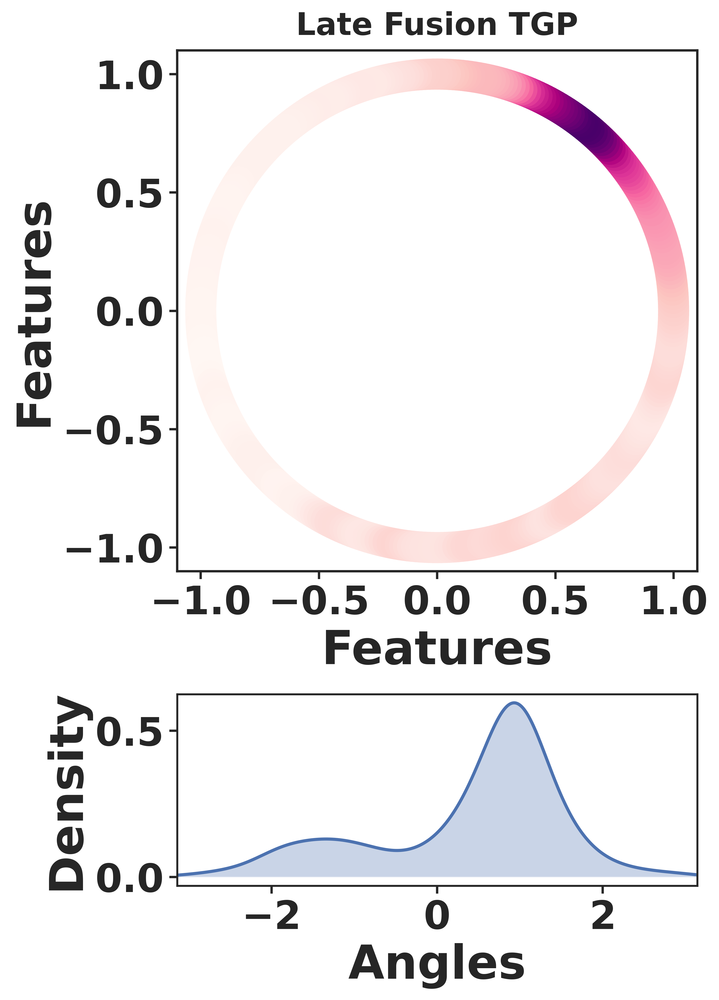

In [17]:
LATE_DIR = f"{ROOT_MULTI}/late_fusion_TGP"
X_train = np.load(f"{LATE_DIR}/late_TGP_emb_train.npy")
X_test  = np.load(f"{LATE_DIR}/late_TGP_emb_test.npy")
X = np.vstack([X_train, X_test])
plot_ring_density(
    X, title="Late Fusion TGP",
    ring_mode="kde2d", bw_2d=0.1,
    save_path=str(OUT_DIR / "ring_late_TGP.png")
)
